This is a notebook used to import raw stress/strain data from wire testing, clean the data, transform to correct database format, and plot using matplotlib. 

Text(0.5, 0, 'Strain')

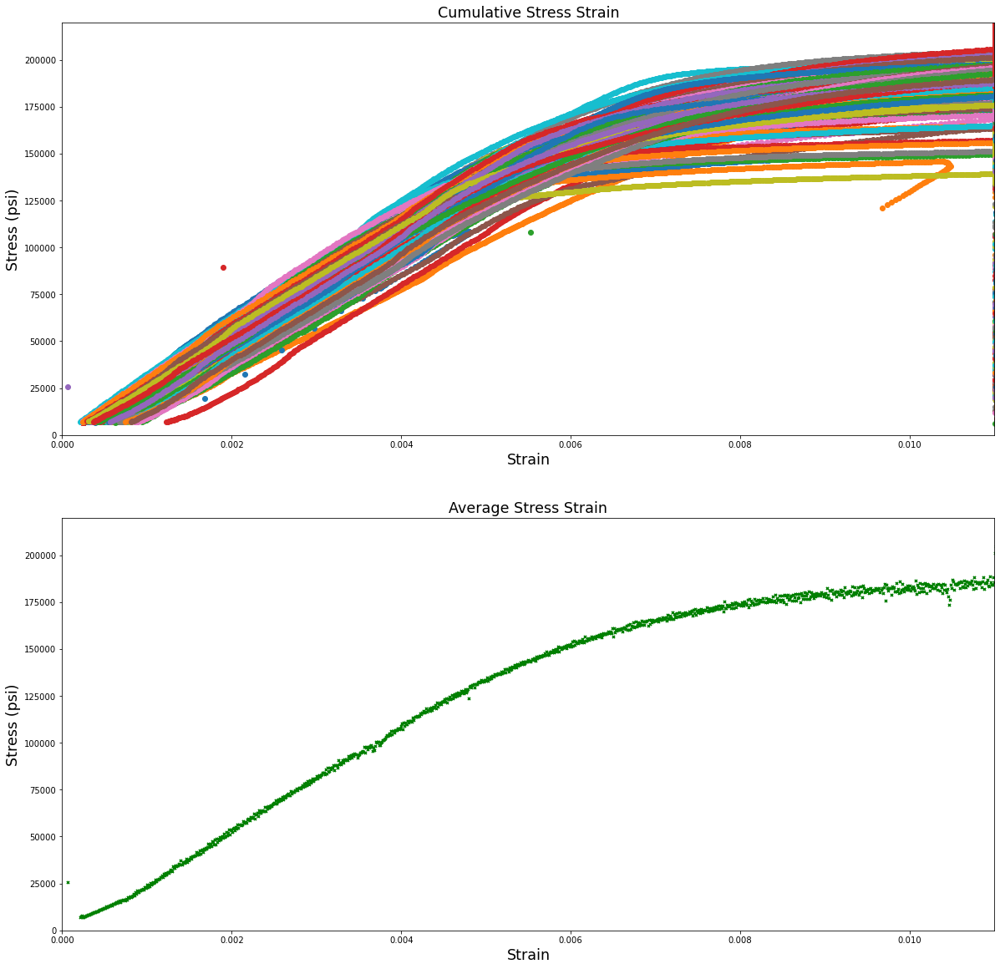

In [96]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go


# Reading CSV Data via Pandas (Py Library) - Data was previously processed in MATLAB -

# get relative data folder
#PATH = pathlib.Path(__file__).parent
#DATA_PATH = PATH.joinpath("../applications/datasets").resolve()

# Load csv and remove all zero or empty columns:
df = pd.read_csv(("stressstrain.csv"))
nan_value = float("NaN")
df.replace(0, nan_value, inplace=True)
df.replace("NaN", 0, inplace=True)
df.dropna(how='all', axis=1, inplace=True)
df.describe()

length = df.shape[1]
cols = df.columns

plt.subplots(2,1, figsize = (20,20))
plt.subplot(2,1, 1)

for i in range (0,length,2):
   plt.scatter(df[cols[i+1]], df[cols[i]])

plt.xlim(0, .011)
plt.ylim(0, 220000)
plt.title("Cumulative Stress Strain", fontsize = 17.5)
plt.ylabel('Stress (psi)', fontsize = 17.5)
plt.xlabel('Strain', fontsize = 17.5)


# Average of all the curves:

import numpy_indexed as npi
import numpy as np

x1 =[]
y1 =[]
for i in range (0,length,2):
    x1 = [df[cols[i+1]], *x1]
    y1 = [df[cols[i]], *y1]
    
x = np.concatenate(x1)
y = np.concatenate(y1)
x_unique, y_mean = npi.group_by(x).mean(y)

plt.subplot(2,1, 2)
plt.scatter(x_unique,y_mean,marker='x', color='g', s=10)
plt.xlim(0, .011)
plt.ylim(0, 220000)

plt.title("Average Stress Strain", fontsize = 17.5)
plt.ylabel('Stress (psi)', fontsize = 17.5)
plt.xlabel('Strain', fontsize = 17.5)


In [108]:

fig = go.Figure(data=go.Scattergl(
    x = x_unique,
    y = y_mean/1000,
    mode='markers',
    marker=dict(
        colorscale='Viridis',
        line_width=1
    )
))

fig.update_xaxes(range=[0, 0.01])
fig.update_yaxes(range=[0, 210])

fig.update_layout(
    width = 800,
    height = 500,
    title = "Average Stress-Strain for Wires"
)

fig.update_xaxes(
        
        title_text = "Strain",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Stress (ksi)",
        title_font = {"size": 20},
        title_standoff = 25)

fig.show()